In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

In [3]:
path = 'DATA/agri_data/'

# Preprocessing

In [4]:
df = pd.read_csv('DATA/agri_label.csv')

In [5]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,agri_0_9354.jpeg,512,512,weed,63,120,425,442
1,agri_0_9354.jpeg,512,512,weed,0,1,180,148
2,agri_0_7574.jpeg,512,512,crop,95,167,453,469
3,agri_0_8960.jpeg,512,512,weed,52,76,422,353
4,agri_0_417.jpeg,512,512,weed,7,75,511,411


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2072 entries, 0 to 2071
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2072 non-null   object
 1   width     2072 non-null   int64 
 2   height    2072 non-null   int64 
 3   class     2072 non-null   object
 4   xmin      2072 non-null   int64 
 5   ymin      2072 non-null   int64 
 6   xmax      2072 non-null   int64 
 7   ymax      2072 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 129.6+ KB


now checking all labeled images are available in the folder or not 

In [7]:
folder_images = os.listdir(path= r"C:\Users\Pooja\Downloads\implementation_of_RCNN-master\DATA\agri_data\agri_data")

In [8]:
len(folder_images)

1300

In [9]:
train_images = folder_images[:1000]

In [10]:
test_images = folder_images[1000:]

In [11]:
j=0
for i in tqdm(list(df['filename'].unique())):
    if i in folder_images:
        j+=1
print(j)        

100%|██████████| 1300/1300 [00:00<00:00, 82420.27it/s]

1300


# Visualizing the Dataset

16it [00:04,  3.26it/s]


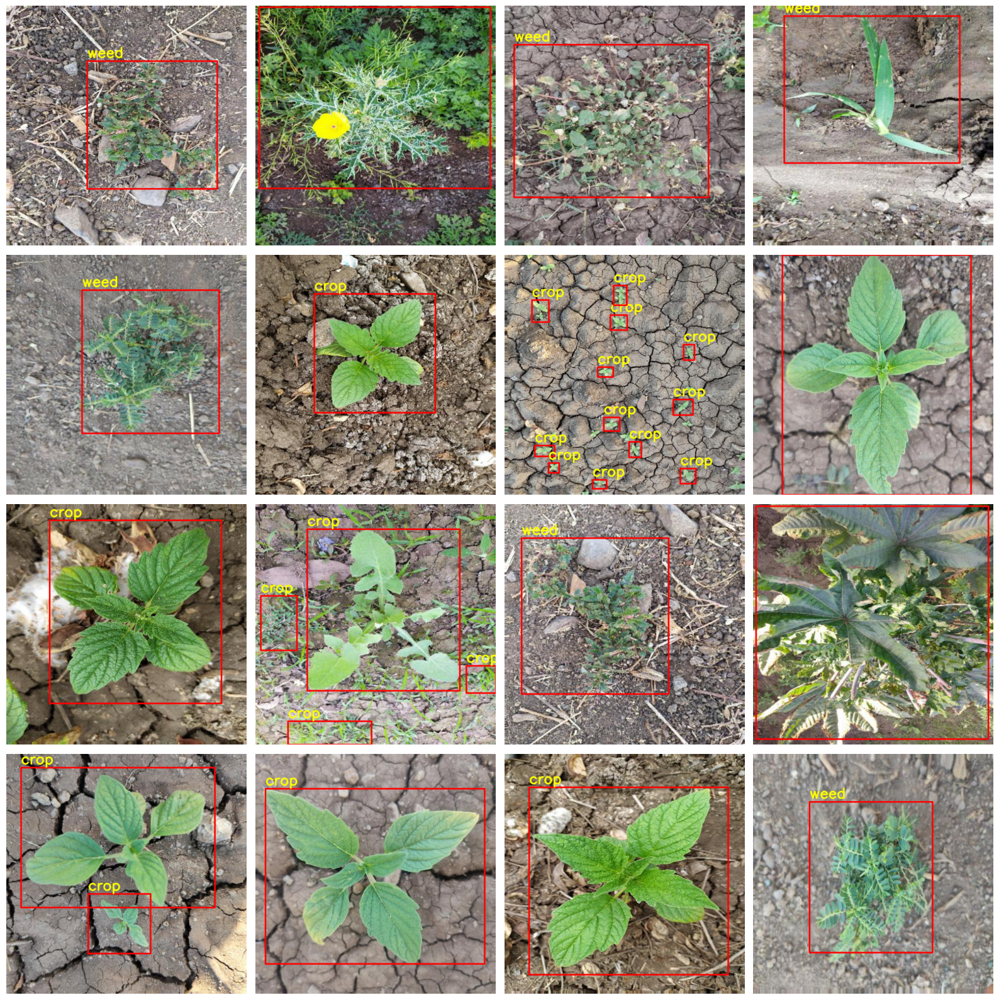

In [12]:
import os
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assuming df is a pandas DataFrame with 'filename', 'xmin', 'ymin', 'xmax', 'ymax', 'class' columns.

# Specify the path to your folder (you can update it as per your system's path)
path = 'C:/Users/Pooja/Downloads/implementation_of_RCNN-master/DATA/agri_data/agri_data/'


# Create subplots
fig, axes = plt.subplots(4, 4, figsize=(16, 16))

# Loop through the first 16 images and the axes for displaying them
for i, ax in tqdm(zip(range(16), axes.flat)):
    if i >= len(folder_images):
        break  # Break the loop if there are fewer than 16 images
    
    # Get the data for the current image from the DataFrame
    temp_df = df[df['filename'] == folder_images[i]].reset_index(drop=True)
    
    # Correct usage of os.path.join() to construct the full image path
    temp_img_path = os.path.join(path, folder_images[i])
    
    # Read the image
    temp_img = cv2.imread(temp_img_path)
    
    if temp_img is None:
        print(f"Could not read image: {temp_img_path}")
        continue  # Skip to the next image if the image couldn't be loaded
    
    # Convert BGR (OpenCV format) to RGB (matplotlib format)
    temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)
    
    # Draw the bounding boxes and labels
    for j in range(len(temp_df)):
        xmin, ymin, xmax, ymax = temp_df.loc[j, ['xmin', 'ymin', 'xmax', 'ymax']]
        class_label = temp_df.loc[j, 'class']
        
        # Draw the rectangle (bounding box)
        rect = cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2, cv2.LINE_AA)
        
        # Put text (class label) on the image
        rect_text = cv2.putText(rect, class_label, (xmin, ymin - 8), 
                                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2, cv2.LINE_AA)
    
    # Show the image with bounding boxes and text in the subplot
    ax.imshow(rect_text)
    ax.axis('off')  # Turn off axis labels

plt.tight_layout()
plt.show()


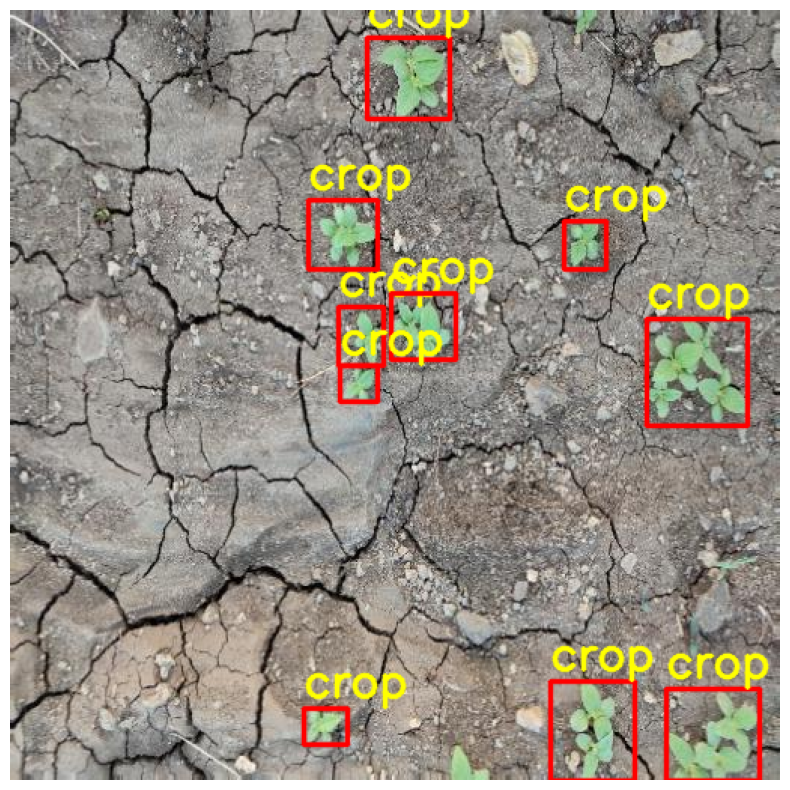

In [34]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd  # Ensure pandas is imported
from tqdm import tqdm

# Assuming df is a pandas DataFrame with 'filename', 'xmin', 'ymin', 'xmax', 'ymax', 'class' columns.
# Make sure your DataFrame 'df' is already defined before this code

# Specify the path to your folder
path = 'C:/Users/Pooja/Downloads/implementation_of_RCNN-master/DATA/agri_data/agri_data/'

# Specify the specific image you want to load
specific_image = 'agri_0_495.jpeg'  # Change this to the image you want to display

# Create a figure for displaying the image
fig, ax = plt.subplots(figsize=(8, 8))

# Get the data for the specific image from the DataFrame
temp_df = df[df['filename'] == specific_image].reset_index(drop=True)

# Construct the full image path
temp_img_path = os.path.join(path, specific_image)

# Read the image
temp_img = cv2.imread(temp_img_path)

if temp_img is None:
    print(f"Could not read image: {temp_img_path}")
else:
    # Convert BGR (OpenCV format) to RGB (matplotlib format)
    temp_img = cv2.cvtColor(temp_img, cv2.COLOR_BGR2RGB)

    # Draw the bounding boxes and labels
    for j in range(len(temp_df)):
        xmin, ymin, xmax, ymax = temp_df.loc[j, ['xmin', 'ymin', 'xmax', 'ymax']]
        class_label = temp_df.loc[j, 'class']
        
        # Draw the rectangle (bounding box)
        rect = cv2.rectangle(temp_img, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2, cv2.LINE_AA)
        
        # Put text (class label) on the image
        rect_text = cv2.putText(rect, class_label, (xmin, ymin - 8), 
                                cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255, 0), 2, cv2.LINE_AA)

    # Show the image with bounding boxes and text
    ax.imshow(rect_text)
    ax.axis('off')  # Turn off axis labels

plt.tight_layout()
plt.show()


# Selective search

In [14]:
cv2.setUseOptimized(True);
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

In [15]:
img = cv2.imread(path+folder_images[1080])
ss.setBaseImage(img)
ss.switchToSelectiveSearchFast()
rects = ss.process()

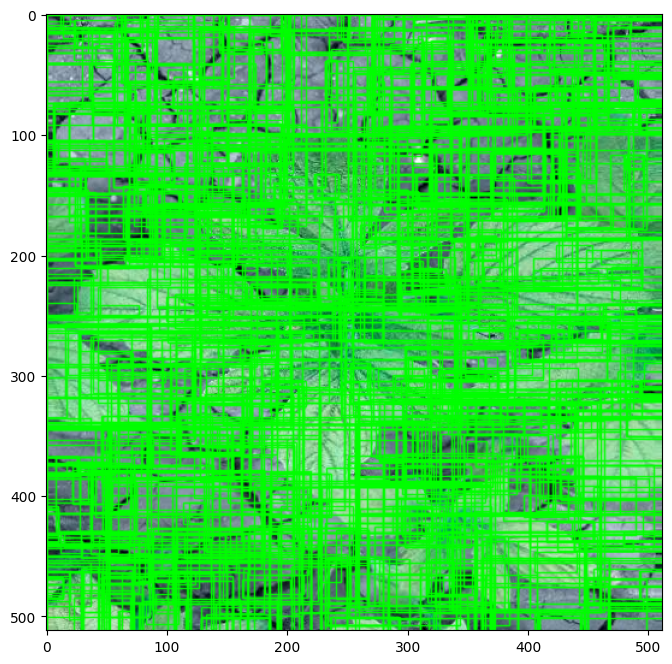

In [16]:
sel_rects = rects[:1200]
imOut = img.copy()
for i, rect in (enumerate(sel_rects)):
    x, y, w, h = rect
    cv2.rectangle(imOut, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
plt.figure(figsize=(8,8))
plt.imshow(imOut)

# Define some function
Now we use our defined function for getting region proposal from images. In this function we just have to add image path and dataframe which contain true label of that image in ['filename','width','height','class','xmin','ymin','xmax','ymax'] this format.

# Check for one image

In [17]:
from region_proposals import iou_filter

In [18]:
ss,neg =iou_filter(path+folder_images[1280],df,thresh=0.5)

Now visualize only region which have IoU greater than 0.5

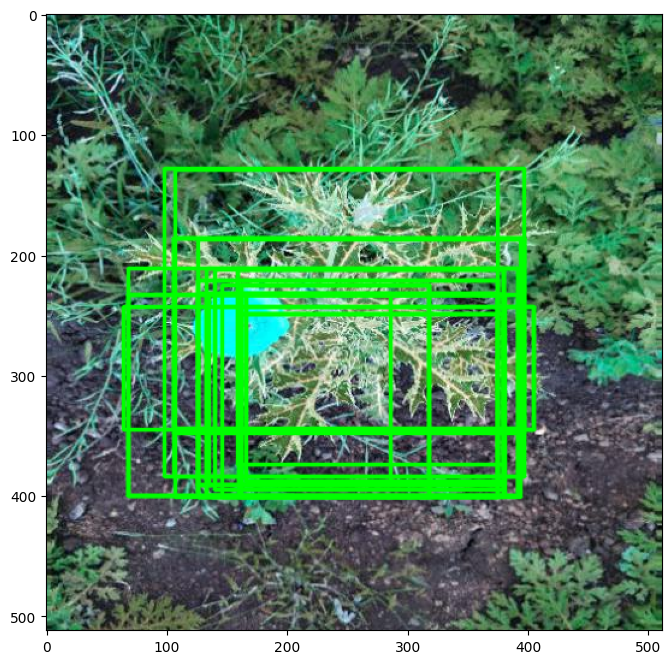

In [19]:
img = cv2.imread(path+folder_images[1])
for i, rect in (enumerate(ss)):
    x, y, w, h = rect[0]
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2, cv2.LINE_AA)
    
plt.figure(figsize=(12,8))
plt.imshow(img)

In [20]:
len(ss)

31

In [21]:
len(neg)

61

Regions which has iou < 0.2 Which will use for background class training in CNN

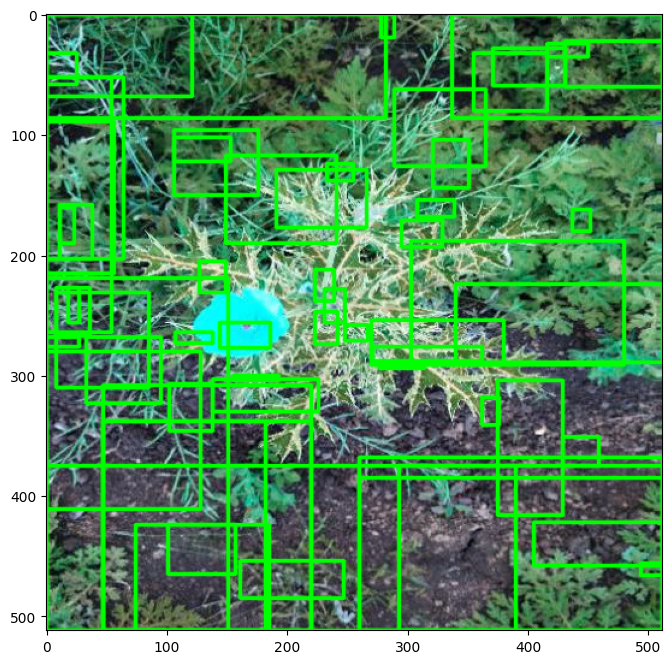

In [22]:
img = cv2.imread(path+folder_images[1])
for i, rect in (enumerate(neg)):
    x, y, w, h = rect
    
    cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2, cv2.LINE_AA)
    
    
plt.figure(figsize=(12,8))
plt.imshow(img)

# Saving all region proposal of all images

In [23]:
train_data = {}
test_data  = {}

This will take arround 1.5 hour to process so if you don't want to proccess it all ready in DATA directory.

In [24]:
for i,img in tqdm(enumerate(train_images)):
    ss,neg =iou_filter(path + img , df , thresh=0.5)
    train_data[img] = {'region_proposal':ss,'negative_example':neg}

2it [00:18,  9.36s/it]


KeyboardInterrupt: 

In [65]:
for i,img in tqdm(enumerate(test_images)):
    ss,neg =iou_filter(path + img , df , thresh=0.5)
    test_data[img] = {'region_proposal':ss,'negative_example':neg}

300it [23:13,  4.64s/it]


In [25]:
#converting numpy instantant into python datatype
import json
class MyEncoder(json.JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.integer):
            return int(obj)
        elif isinstance(obj, np.floating):
            return float(obj)
        elif isinstance(obj, np.ndarray):
            return obj.tolist()
        else:
            return super(MyEncoder, self).default(obj)

In [26]:
with open('train.json','w+') as output_file:
    json.dump(train_data,output_file,cls=MyEncoder)

In [27]:
with open('test.json','w+') as output_file:
    json.dump(test_data,output_file,cls=MyEncoder)

checking our conversion is right or wrong

In [28]:
with open('train.json') as train:
    train_json = json.load(train)

In [29]:
with open('test.json') as test:
    test_json = json.load(test)

In [30]:
train_json == train_data

True

In [31]:
test_json == test_data

True